In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import glob
import os
import sys
from PIL import Image

## Load data

In [2]:
#masks = glob.glob("../input/isbi2015/train/label/*.png")
#orgs = glob.glob("../input/isbi2015/train/image/*.png")


masks = glob.glob("../../Cat-Segmentation/Data/Train_Data/mask/mask/*.png")
orgs = glob.glob("../../Cat-Segmentation/Data/Train_Data/image/image/*.jpg")

In [3]:
imgs_list = []
masks_list = []
for image, mask in zip(orgs, masks):
    imgs_list.append(np.array(Image.open(image).resize((512,512))))
    
    im = Image.open(mask).resize((512,512))
    #width, height = im.size   # Get dimensions

    #left = (width - 388)/2
    #top = (height - 388)/2
    #right = (width + 388)/2
    #bottom = (height + 388)/2

    #im_cropped = im.crop((left, top, right, bottom))
    masks_list.append(np.array(im))

imgs_np = np.asarray(imgs_list)
masks_np = np.asarray(masks_list)

In [4]:
print(imgs_np.shape, masks_np.shape)

(81, 512, 512, 3) (81, 512, 512)


In [1]:
!pip install -–upgrade pip
!pip install keras_unet
!pip install scikit-learn
!pip install scipy
!pip install -U segmentation-models


Usage:   
  pip install [options] <requirement specifier> [package-index-options] ...
  pip install [options] -r <requirements file> [package-index-options] ...
  pip install [options] [-e] <vcs project url> ...
  pip install [options] [-e] <local project path> ...
  pip install [options] <archive url/path> ...

no such option: -–
     |████████████████████████████████| 50 kB 3.8 MB/s             
     |████████████████████████████████| 12.4 MB 82.9 MB/s            
     |████████████████████████████████| 148 kB 83.7 MB/s            
     |████████████████████████████████| 3.3 MB 72.6 MB/s            
     |████████████████████████████████| 4.4 MB 79.3 MB/s            
     |████████████████████████████████| 1.6 MB 83.5 MB/s            
     |████████████████████████████████| 3.3 MB 82.8 MB/s            
     |████████████████████████████████| 3.1 MB 74.3 MB/s            
  Attempting uninstall: pillow
    Found existing installation: Pillow 8.3.1
    Uninstalling Pillow-8.3.1:
      

## Plot images + masks + overlay (mask over original)

-----------------------------------------
keras-unet init: TF version is >= 2.0.0 - using `tf.keras` instead of `Keras`
-----------------------------------------


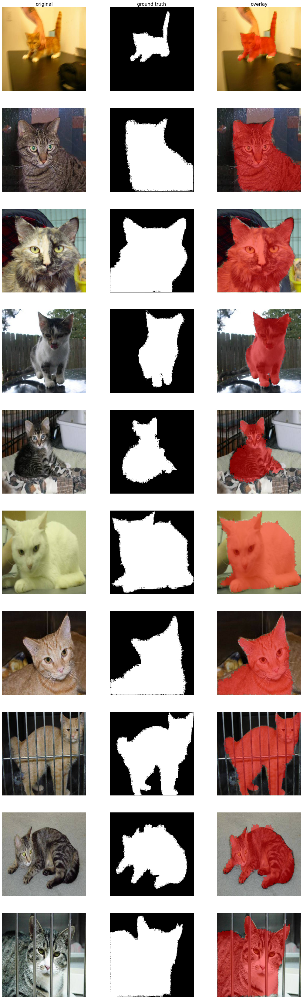

In [6]:
from keras_unet.utils import plot_imgs

plot_imgs(org_imgs=imgs_np, mask_imgs=masks_np, nm_img_to_plot=10, figsize=6)


## Get data into correct shape, dtype and range (0.0-1.0)

In [5]:
print(imgs_np.max(), masks_np.max())

255 1


In [174]:
print(np.unique(imgs_np), np.unique(masks_np))

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245 24

In [4]:
x = np.asarray(imgs_np, dtype=np.float32)/255
#x = np.asarray(imgs_np, dtype=np.float32)
#x = imgs_np
#y = np.asarray(masks_np, dtype=np.float32)/255
y = np.asarray(masks_np, dtype=np.float32)

In [14]:
print(x.max(), y.max())

1.0 1.0


In [11]:
print(x.shape, y.shape)

(81, 512, 512, 3) (81, 512, 512)


In [5]:
y = y.reshape(y.shape[0], y.shape[1], y.shape[2], 1)
print(x.shape, y.shape)

(81, 512, 512, 3) (81, 512, 512, 1)


In [16]:
x = x.reshape(x.shape[0], x.shape[1], x.shape[2], 1)
print(x.shape, y.shape)

ValueError: cannot reshape array of size 63700992 into shape (81,512,512,1)

##  Train/val split

In [6]:
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(x, y, test_size=0.1, random_state=0)

print("x_train: ", x_train.shape)
print("y_train: ", y_train.shape)
print("x_val: ", x_val.shape)
print("y_val: ", y_val.shape)

x_train:  (72, 512, 512, 3)
y_train:  (72, 512, 512, 1)
x_val:  (9, 512, 512, 3)
y_val:  (9, 512, 512, 1)


## Prepare train generator with data augmentation

In [28]:
from keras_unet.utils import get_augmented

train_gen = get_augmented(
    x_train, y_train, batch_size=64,
    data_gen_args = dict(
        rotation_range=15.,
        width_shift_range=0.05,
        height_shift_range=0.05,
        shear_range=10,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=False,
        fill_mode='constant'
    ))

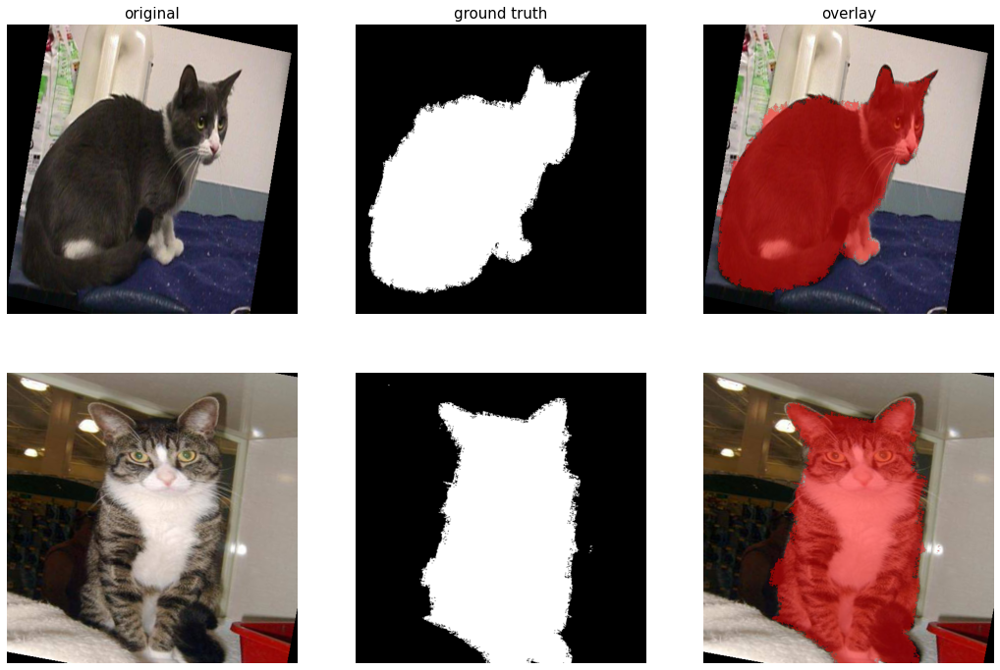

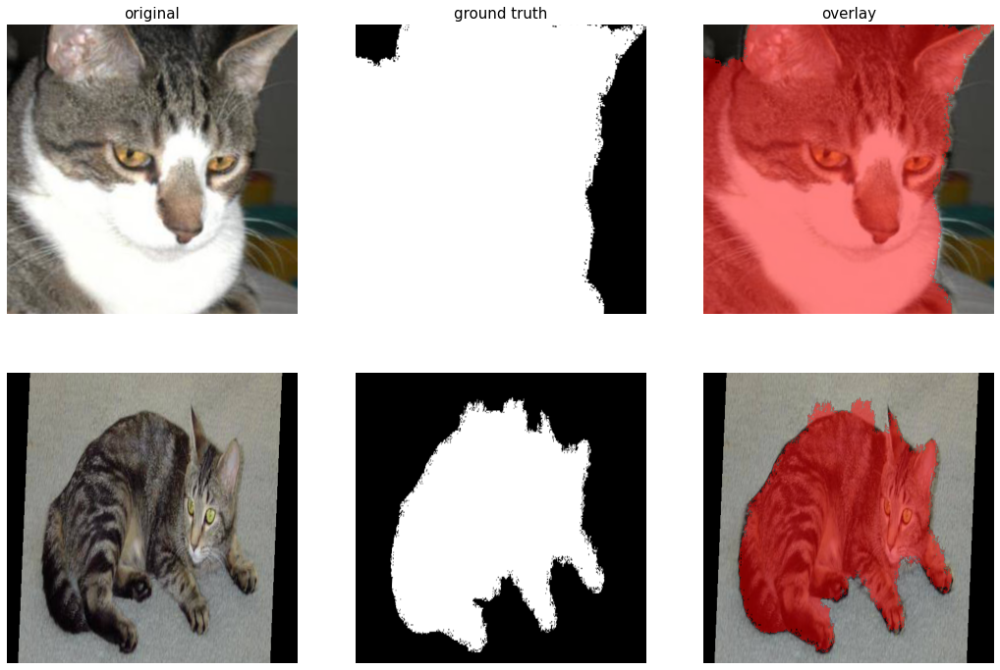

In [29]:
from keras_unet.utils import plot_imgs
for i in range(2):
  sample_batch = next(train_gen)
  xx, yy = sample_batch
  #yy = np.round_(yy)
  #print(xx.shape, yy.shape)
  #print(np.unique(yy[0]))


  plot_imgs(org_imgs=xx, mask_imgs=yy, nm_img_to_plot=2, figsize=6)

In [7]:
#for i in range(len(yy))[:2]:
#    img = Image.fromarray(yy[i]*255)
#    msk = Image.fromarray(xx[i])
#    img.show()
#    msk.show()
#Image.fromarray(xx.)
#Image.fromarray((xx[0] * 255).astype(np.uint8))
#Image.fromarray( (yy[0]).astype(np.uint8)  )
#d = np.squeeze(yy[0], axis=2)  # axis=2 is channel dimension 
#Image.fromarray(d)

In [122]:
!pwd

/tf/oxford_pets_new/keras-unet/notebooks


-----------------------------------------
keras-unet init: TF version is >= 2.0.0 - using `tf.keras` instead of `Keras`
-----------------------------------------
Found 81 images belonging to 1 classes.
Found 81 images belonging to 1 classes.
(16, 512, 512, 3)


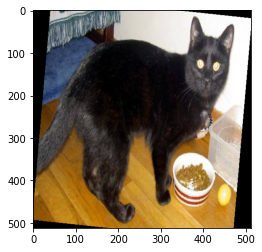

(16, 512, 512, 3)


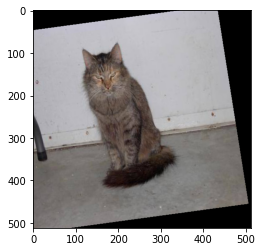

(16, 512, 512, 3)


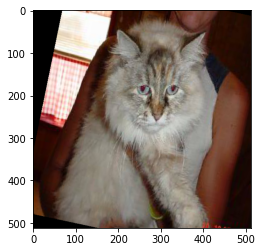

(16, 512, 512, 3)
[0. 1.]


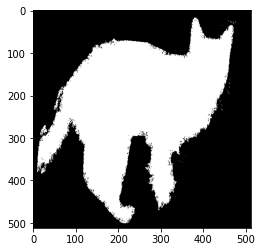

(16, 512, 512, 3)
[0. 1.]


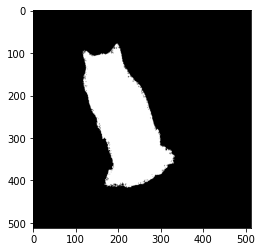

(16, 512, 512, 3)
[0. 1.]


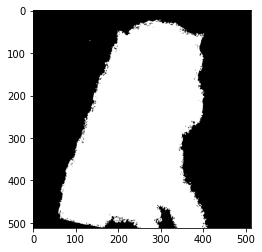

In [7]:
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from PIL import Image
import numpy as np
from keras_unet.metrics import iou, iou_thresholded

img_width, img_height = 512,512
channels = 3
batch_size = 16
seed = 4
train_samples =30
import matplotlib.pyplot as plt

image_datagen = ImageDataGenerator(
         horizontal_flip=True,
        # vertical_flip=True,
         rescale=1. / 255,
      #   preprocessing_function=add_noise,
         width_shift_range=[0,40], 
         zoom_range=[0.9,1.1],
          rotation_range=15,
          shear_range=0.1,
           fill_mode='constant', cval=0
           
    )

mask_datagen = ImageDataGenerator(
         horizontal_flip=True,
        # vertical_flip=True,
      #   rescale=1. / 255,
      #   preprocessing_function=add_noise,
         width_shift_range=[0,40], 
         zoom_range=[0.9,1.1],
          rotation_range=15,
          shear_range=0.1,
           fill_mode='constant', cval=0
           
    )

# this is the augmentation configuration we will use for testing:
# only rescaling

#masks = glob.glob("../../Cat-Segmentation/Data/Train_Data/mask/mask/*.png")
#orgs = glob.glob("../input/isbi2015/train/image/*.png")
#orgs = glob.glob("../../Cat-Segmentation/Data/Train_Data/image/image/*.jpg")


image_generator = image_datagen.flow_from_directory(
   "../../../oxford_pets_new/Cat-Segmentation/Data/Train_Data/image/", #"./oxford_pets_new/train/image/",
   # "./oxford_pets_new/cells/train/images/",
   # "./oxford_pets_new/train/image/",
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode=None,seed=seed)
                                
mask_generator = mask_datagen.flow_from_directory(
    "../../../oxford_pets_new/Cat-Segmentation/Data/Train_Data/mask/", #"./oxford_pets_new/train/image/",
   # "./oxford_pets_new/cells/train/mask/",
   # "./oxford_pets_new/train/mask/",
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode=None,seed=seed)     

def my_image_mask_generator(image_data_generator, mask_data_generator):
    train_generator = zip(image_data_generator, mask_data_generator)
    for (img, mask) in train_generator:
        yield (img, mask)
train_generator = my_image_mask_generator(image_generator, mask_generator)


train_generator = zip(image_generator, mask_generator)

#for batch in train_datagen.flow("./oxford_pets_new/train/image/image/basset_hound_119.jpg", batch_size=1):
#print(dir(train_datagen))

for i in range(3):
  img = image_generator.next()
  print(img.shape)   #  (1,256,256,3)
  plt.imshow(img[0])
  plt.show()
  #plt.savefig("../../../oxford_pets_new/Cat-Segmentation/Data_1/image/image/cat_"+str(i)+".jpg")  

for i in range(3):
  msk = mask_generator.next()
  print(msk.shape)   #  (1,256,256,3)
  msk[0] = np.round_(msk[0])  
  print(np.unique(msk[0]))
  plt.imshow(msk[0])
  #plt.imshow()
  #plt.savefig("../../../oxford_pets_new/Cat-Segmentation/Data_1/image/image/mask_"+str(i)+".png")
  plt.show()
                    
  

In [165]:
im = Image.open("../../../oxford_pets_new/Cat-Segmentation/Data_1/image/image/mask_2.png")


ValueError: cannot reshape array of size 497664 into shape (224,224,1)

## Initialize network

In [180]:
from keras_unet.models import custom_unet

input_shape = x_train[0].shape

model = custom_unet(
    input_shape,
    use_batch_norm=False,
    num_classes=1,
    filters=64,
    dropout=0.2,
    output_activation='sigmoid')



In [8]:
import segmentation_models as sm
sm.set_framework('tf.keras')
sm.framework()
import segmentation_models as sm

BACKBONE = 'resnet34'
preprocess_input = sm.get_preprocessing(BACKBONE)

# load your data


# define model
model = sm.Unet(BACKBONE, input_shape=(512,512,3),encoder_weights='imagenet',classes=1, activation='sigmoid')



Segmentation Models: using `keras` framework.
85532672/85521592 [==============================] - 5s 0us/step


In [ ]:
from tensorflow.keras import layers,Input,Model


def get_model(img_size, num_classes):
    inputs = Input(shape=img_size + (1,))

    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel classification layer
    outputs = layers.Conv2D(num_classes, 3, activation="softmax", padding="same")(x)

    # Define the model
    model = Model(inputs, outputs)
    return model

model = get_model(img_size=(512,512), num_classes=1)

In [17]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
data (InputLayer)               [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
bn_data (BatchNormalization)    (None, 512, 512, 3)  9           data[0][0]                       
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 518, 518, 3)  0           bn_data[0][0]                    
__________________________________________________________________________________________________
conv0 (Conv2D)                  (None, 256, 256, 64) 9408        zero_padding2d[0][0]             
____________________________________________________________________________________________

In [33]:
import os
os.environ["PATH"] += os.pathsep + "C:\\Program Files (x86)\\Graphviz2.38\\bin\\"

In [ ]:
import sys
print(sys.path)

sys.path.append("C:\\Program Files (x86)\\Graphviz2.38\\bin\\") 

print(sys.path)

In [17]:
from keras.utils import plot_model
plot_model(model, to_file='model.png')

## Compile + train

In [9]:
from keras.callbacks import ModelCheckpoint


model_filename = 'segm_model_v0.h5'
callback_checkpoint = ModelCheckpoint(
    model_filename, 
    verbose=1, 
    monitor='val_loss', 
    save_best_only=True,
)

In [202]:
from tensorflow.keras.optimizers import Adam, SGD
from keras_unet.metrics import iou, iou_thresholded
from keras_unet.losses import jaccard_distance

model.compile(
    #optimizer=Adam(learning_rate=0.01), 
    #optimizer=SGD(learning_rate=0.01, momentum=0.99),
    loss='binary_crossentropy',
    #loss=jaccard_distance,
    metrics=["accuracy"]
)


In [14]:
from tensorflow.keras.optimizers import Adam, SGD

model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss=sm.losses.bce_jaccard_loss,
    metrics=[sm.metrics.iou_score],
)

Epoch 1/10
5/5 [==============================] - 11s 3s/step - loss: 0.1858 - iou_score: 0.8951 - val_loss: 0.1409 - val_iou_score: 0.9291

Epoch 00001: val_loss improved from 0.14255 to 0.14085, saving model to segm_model_v0.h5
Epoch 2/10
5/5 [==============================] - 11s 2s/step - loss: 0.1718 - iou_score: 0.9079 - val_loss: 0.1415 - val_iou_score: 0.9290

Epoch 00002: val_loss did not improve from 0.14085
Epoch 3/10
5/5 [==============================] - 15s 3s/step - loss: 0.1681 - iou_score: 0.9133 - val_loss: 0.1397 - val_iou_score: 0.9300

Epoch 00003: val_loss improved from 0.14085 to 0.13971, saving model to segm_model_v0.h5
Epoch 4/10
5/5 [==============================] - 12s 3s/step - loss: 0.1866 - iou_score: 0.8957 - val_loss: 0.1379 - val_iou_score: 0.9310

Epoch 00004: val_loss improved from 0.13971 to 0.13785, saving model to segm_model_v0.h5
Epoch 5/10
5/5 [==============================] - 11s 2s/step - loss: 0.1678 - iou_score: 0.9102 - val_loss: 0.1355 - 

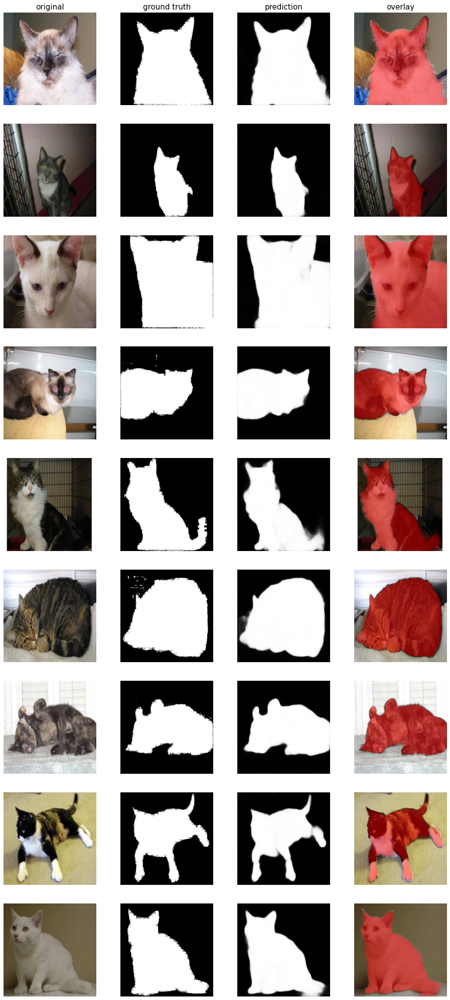

Epoch 1/10
5/5 [==============================] - 13s 3s/step - loss: 0.1711 - iou_score: 0.8982 - val_loss: 0.1338 - val_iou_score: 0.9287

Epoch 00001: val_loss did not improve from 0.13348
Epoch 2/10
5/5 [==============================] - 12s 2s/step - loss: 0.1728 - iou_score: 0.9093 - val_loss: 0.1340 - val_iou_score: 0.9281

Epoch 00002: val_loss did not improve from 0.13348
Epoch 3/10
5/5 [==============================] - 13s 2s/step - loss: 0.1703 - iou_score: 0.9009 - val_loss: 0.1331 - val_iou_score: 0.9281

Epoch 00003: val_loss improved from 0.13348 to 0.13309, saving model to segm_model_v0.h5
Epoch 4/10
5/5 [==============================] - 11s 2s/step - loss: 0.1731 - iou_score: 0.8944 - val_loss: 0.1353 - val_iou_score: 0.9271

Epoch 00004: val_loss did not improve from 0.13309
Epoch 5/10
5/5 [==============================] - 12s 2s/step - loss: 0.1749 - iou_score: 0.8997 - val_loss: 0.1385 - val_iou_score: 0.9258

Epoch 00005: val_loss did not improve from 0.13309
Ep

KeyboardInterrupt: 

In [38]:
from keras_unet.utils import plot_imgs
from random import seed
from random import randint

for j in range(7):
    for i in range(30):
        seed = randint(0, 100)  
        history = model.fit(
        train_generator,    
        steps_per_epoch=5,
        epochs=10,
        validation_data=(x_val, y_val),
        callbacks=[callback_checkpoint]
    )
        
        print("------------------------------------------------------")
        print("counter=", (j+1)*(i+1)*10)
        print("------------------------------------------------------")
        
        y_pred = model.predict(x_val)
        plot_imgs(org_imgs=x_val, mask_imgs=y_val, pred_imgs=y_pred, nm_img_to_plot=15)


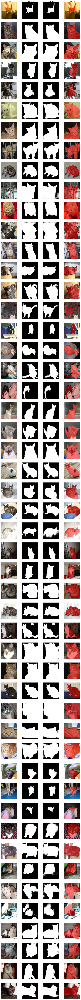

In [19]:
plot_imgs(org_imgs=x, mask_imgs=y, pred_imgs=y_pred, nm_img_to_plot=50)

## Plot training history

KeyError: 'val_iou'

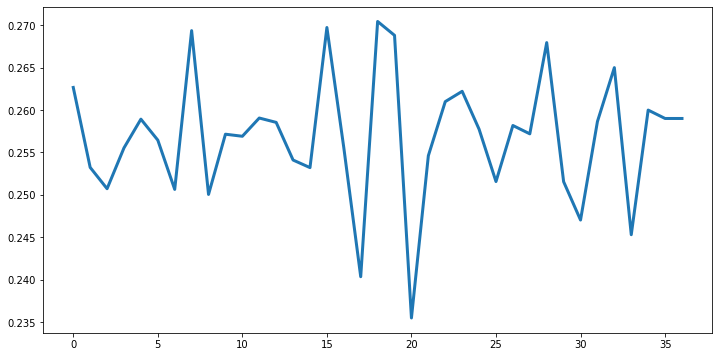

In [191]:
from keras_unet.utils import plot_segm_history

plot_segm_history(history)

## Plot original + ground truth + pred + overlay (pred on top of original)

In [47]:
from keras.models import load_model

#model = load_wights("segm_model_v0.h5")
img = Image.open("cat2.jpg") 
img = np.array(img.resize((512,512)))
img = np.asarray(img, dtype=np.float32)/255
img = img.reshape(1,img.shape[0], img.shape[1], img.shape[2])
img.shape
y_pred = model.predict(img)

In [45]:
img.shape

(1, 512, 512, 3)

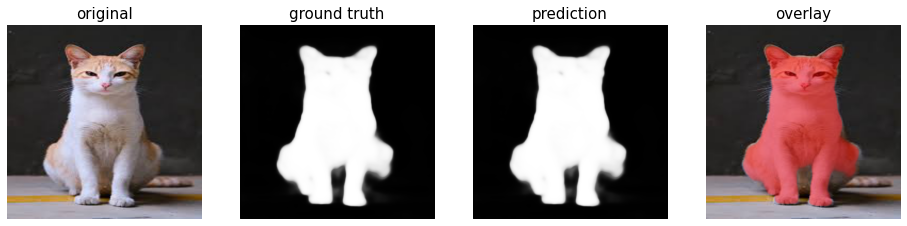

In [48]:
from keras_unet.utils import plot_imgs

plot_imgs(org_imgs=img, mask_imgs=y_pred, pred_imgs=y_pred, nm_img_to_plot=1)